유효 컬럼: 픽업/드롭오프/패신저/딛스턴스/페어/팁/톨스/토탈/페이먼트

** 회귀 모델

데이터파일 :  taxi.csv

구현 모델 : 택시요금 예측 모델

In [3]:
## 모듈로딩
import pandas as pd  # 데이터 모듈
import numpy as np

import torch         
# tensor 및 기본 함수 모듈   
import torch.nn as nn
# 인공신경망 관련 모듈
import torch.nn.functional as F
# 인공신경망 관련 함수
import torch.optim as optim
# 최적화 모듈

from sklearn.model_selection import train_test_split
# 학습용 데이터셋 관련 함수

from torchmetrics.regression import *
from torch.utils.data import Dataset, DataLoader

import os
import sys
import tools as ts

In [4]:
dataDF = pd.DataFrame(pd.read_csv('../_data/taxis.csv', engine='python'))
taxDF = dataDF.copy()

In [5]:
taxDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6433 entries, 0 to 6432
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   pickup           6433 non-null   object 
 1   dropoff          6433 non-null   object 
 2   passengers       6433 non-null   int64  
 3   distance         6433 non-null   float64
 4   fare             6433 non-null   float64
 5   tip              6433 non-null   float64
 6   tolls            6433 non-null   float64
 7   total            6433 non-null   float64
 8   color            6433 non-null   object 
 9   payment          6389 non-null   object 
 10  pickup_zone      6407 non-null   object 
 11  dropoff_zone     6388 non-null   object 
 12  pickup_borough   6407 non-null   object 
 13  dropoff_borough  6388 non-null   object 
dtypes: float64(5), int64(1), object(8)
memory usage: 703.7+ KB


In [6]:
taxDF = taxDF.dropna()

In [7]:
for i in taxDF.columns:
    print(i, taxDF[i].unique().shape)

pickup (6322,)
dropoff (6333,)
passengers (7,)
distance (1064,)
fare (206,)
tip (481,)
tolls (14,)
total (877,)
color (2,)
payment (2,)
pickup_zone (194,)
dropoff_zone (203,)
pickup_borough (4,)
dropoff_borough (5,)


In [8]:
for i in ['passengers','payment', 'pickup_borough', 'dropoff_borough']:
    print(i, taxDF[i].value_counts())

passengers passengers
1    4608
2     865
5     277
3     240
6     152
4     109
0      90
Name: count, dtype: int64
payment payment
credit card    4546
cash           1795
Name: count, dtype: int64
pickup_borough pickup_borough
Manhattan    5226
Queens        638
Brooklyn      378
Bronx          99
Name: count, dtype: int64
dropoff_borough dropoff_borough
Manhattan        5172
Queens            534
Brooklyn          497
Bronx             136
Staten Island       2
Name: count, dtype: int64


In [9]:
taxDF[(taxDF['pickup_borough']=='Bronx') | (taxDF['dropoff_borough']=='Bronx')].index

Index([  92,  174,  350,  443,  508,  612,  665,  673, 1146, 1214,
       ...
       6346, 6381, 6386, 6387, 6393, 6410, 6413, 6422, 6427, 6429],
      dtype='int64', length=169)

In [10]:
taxDF = taxDF.drop(index=taxDF[(taxDF['pickup_borough']=='Bronx') | (taxDF['dropoff_borough']=='Bronx')].index)
taxDF = taxDF.drop(index= taxDF[taxDF['dropoff_borough']=='Staten Island'].index)

In [11]:
taxDF.head()

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan


In [12]:
for i in ['passengers','payment', 'pickup_borough', 'dropoff_borough']:
    print(i, taxDF[i].value_counts())

passengers passengers
1    4459
2     855
5     272
3     234
6     152
4     109
0      89
Name: count, dtype: int64
payment payment
credit card    4431
cash           1739
Name: count, dtype: int64
pickup_borough pickup_borough
Manhattan    5170
Queens        627
Brooklyn      373
Name: count, dtype: int64
dropoff_borough dropoff_borough
Manhattan    5147
Queens        530
Brooklyn      493
Name: count, dtype: int64


 'passengers'
 ordinal로 처리 필요없음

 ['payment', 'pickup_borough', 'dropoff_borough']
 ohe로 처리하기

In [13]:
taxDF = taxDF.drop(index=5364)

In [14]:
# ts.pair_grid(taxDF)

In [15]:
taxDF[taxDF['total']>150]

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough


In [16]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

In [17]:
taxDF = taxDF.reset_index(drop=True)

In [18]:
taxDF.shape

(6169, 14)

In [19]:
ohe = OneHotEncoder()
encoded_payment = ohe.fit_transform(taxDF[['payment']]).toarray()
taxDF= pd.concat((taxDF, pd.DataFrame(encoded_payment, columns=ohe.get_feature_names_out(['payment']))), axis=1)

ohe = OneHotEncoder()
encoded_payment = ohe.fit_transform(taxDF[['pickup_borough']]).toarray()
taxDF= pd.concat((taxDF, pd.DataFrame(encoded_payment, columns=ohe.get_feature_names_out(['pickup_borough']))), axis=1)

ohe = OneHotEncoder()
encoded_payment = ohe.fit_transform(taxDF[['dropoff_borough']]).toarray()
taxDF= pd.concat((taxDF, pd.DataFrame(encoded_payment, columns=ohe.get_feature_names_out(['dropoff_borough']))), axis=1)

In [20]:
len('2019-03-23')

10

In [21]:
for i in taxDF['pickup'].index:
    taxDF['pickup'].iloc[i] = int(taxDF['pickup'].iloc[i][11:13])
    taxDF['dropoff'].iloc[i] = int(taxDF['dropoff'].iloc[i][11:13])

C:\Users\kdt\AppData\Local\Temp\ipykernel_33584\616486571.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  taxDF['pickup'].iloc[i] = int(taxDF['pickup'].iloc[i][11:13])
C:\Users\kdt\AppData\Local\Temp\ipykernel_33584\616486571.py:2: Setti

In [22]:
taxDF['pickup'] = taxDF['pickup'].astype('Int64')
taxDF['dropoff'] = taxDF['dropoff'].astype('Int64')
taxDF['pickup'] = taxDF['pickup']/24
taxDF['dropoff'] = taxDF['dropoff']/24

In [23]:
taxDF['distance'].max(), taxDF['fare'].max(), taxDF['tip'].max()

(30.23, 93.5, 23.19)

In [24]:
import matplotlib.pyplot as plt

[Text(0, 3, '3542'),
 Text(0, 3, '1724'),
 Text(0, 3, '441'),
 Text(0, 3, '205'),
 Text(0, 3, '92'),
 Text(0, 3, '149'),
 Text(0, 3, '10'),
 Text(0, 3, '3'),
 Text(0, 3, '1'),
 Text(0, 3, '2')]

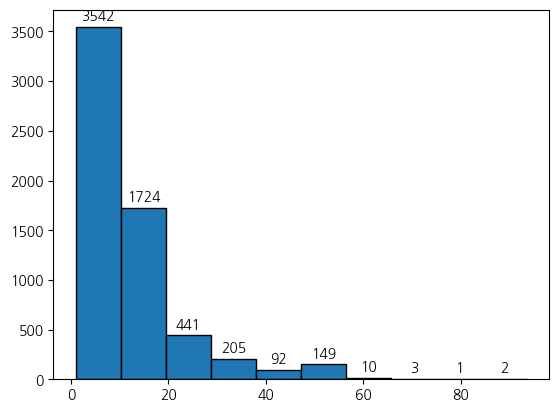

In [25]:


# 히스토그램 생성
fig, ax = plt.subplots()
n, bins, patches = ax.hist(taxDF['fare'], bins=10, edgecolor='black')

# 막대 위에 수치 표시
ax.bar_label(patches, fmt='%d', padding=3)

[Text(0, 3, '4034'),
 Text(0, 3, '1567'),
 Text(0, 3, '304'),
 Text(0, 3, '121'),
 Text(0, 3, '75'),
 Text(0, 3, '52'),
 Text(0, 3, '11'),
 Text(0, 3, '3'),
 Text(0, 3, '1'),
 Text(0, 3, '1')]

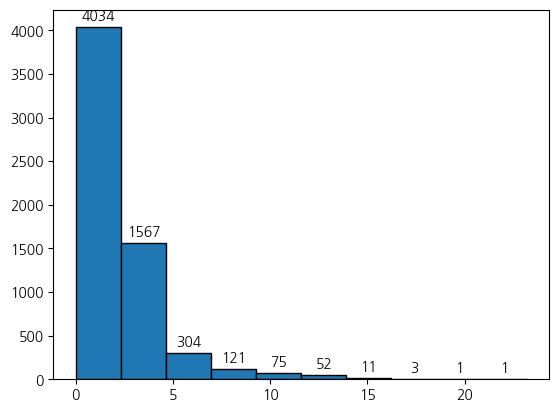

In [26]:


# 히스토그램 생성
fig, ax = plt.subplots()
n, bins, patches = ax.hist(taxDF['tip'], bins=10, edgecolor='black')

# 막대 위에 수치 표시
ax.bar_label(patches, fmt='%d', padding=3)

[Text(0, 3, '5867'),
 Text(0, 3, '0'),
 Text(0, 3, '0'),
 Text(0, 3, '1'),
 Text(0, 3, '295'),
 Text(0, 3, '0'),
 Text(0, 3, '1'),
 Text(0, 3, '1'),
 Text(0, 3, '0'),
 Text(0, 3, '4')]

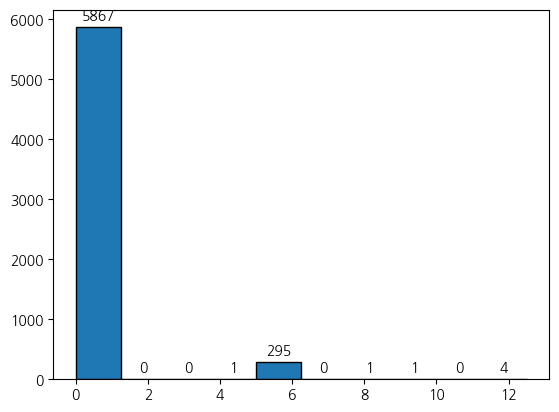

In [27]:


# 히스토그램 생성
fig, ax = plt.subplots()
n, bins, patches = ax.hist(taxDF['tolls'], bins=10, edgecolor='black')

# 막대 위에 수치 표시
ax.bar_label(patches, fmt='%d', padding=3)

In [28]:
newDF = taxDF.drop(columns=['pickup_zone','dropoff_zone','pickup_borough','dropoff_borough','payment','color'])



In [29]:
newDF.columns[newDF.columns != 'total']

Index(['pickup', 'dropoff', 'passengers', 'distance', 'fare', 'tip', 'tolls',
       'payment_cash', 'payment_credit card', 'pickup_borough_Brooklyn',
       'pickup_borough_Manhattan', 'pickup_borough_Queens',
       'dropoff_borough_Brooklyn', 'dropoff_borough_Manhattan',
       'dropoff_borough_Queens'],
      dtype='object')

In [30]:
newDF.iloc[:,8:] = newDF.iloc[:,8:].astype('category')

C:\Users\kdt\AppData\Local\Temp\ipykernel_33584\993162808.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0       0.0
1       1.0
2       0.0
3       0.0
4       0.0
       ... 
6164    0.0
6165    0.0
6166    1.0
6167    0.0
6168    0.0
Name: payment_cash, Length: 6169, dtype: category
Categories (2, float64): [0.0, 1.0]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  newDF.iloc[:,8:] = newDF.iloc[:,8:].astype('category')
C:\Users\kdt\AppData\Local\Temp\ipykernel_33584\993162808.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0       1.0
1       0.0
2       1.0
3       1.0
4       1.0
       ... 
6164    1.0
6165    1.0
6166    0.0
6167    1.0
6168    1.0
Name: payment_credit card, Length: 6169, dtype: category
Categories (2, float64): [0.0, 1.0]' has dtype incompatible with float64, please e

In [31]:
taxDF

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,...,pickup_borough,dropoff_borough,payment_cash,payment_credit card,pickup_borough_Brooklyn,pickup_borough_Manhattan,pickup_borough_Queens,dropoff_borough_Brooklyn,dropoff_borough_Manhattan,dropoff_borough_Queens
0,0.833333,0.833333,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.666667,0.666667,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,...,Manhattan,Manhattan,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.708333,0.75,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.041667,0.041667,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.541667,0.541667,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6164,0.333333,0.333333,1,0.71,4.5,0.50,0.0,5.80,green,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
6165,0.375,0.375,1,0.75,4.5,1.06,0.0,6.36,green,credit card,...,Manhattan,Manhattan,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
6166,0.916667,0.958333,1,4.14,16.0,0.00,0.0,17.30,green,cash,...,Brooklyn,Brooklyn,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
6167,0.416667,0.416667,1,1.12,6.0,0.00,0.0,6.80,green,credit card,...,Brooklyn,Brooklyn,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [32]:
# ts.pair_grid(taxDF)

In [33]:
featureDF = newDF.loc[:, newDF.columns[newDF.columns != 'total']]
# featureDF = newDF.loc[:,['pickup', 'dropoff','distance', 'fare', 'tip']]
targetDF = newDF.loc[:,'total']

In [34]:
featureDF

,pickup,dropoff,passengers,distance,fare,tip,tolls,payment_cash,payment_credit card,pickup_borough_Brooklyn,pickup_borough_Manhattan,pickup_borough_Queens,dropoff_borough_Brooklyn,dropoff_borough_Manhattan,dropoff_borough_Queens
0,0.833333,0.833333,1,1.60,7.0,2.15,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.666667,0.666667,1,0.79,5.0,0.00,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,0.708333,0.75,1,1.37,7.5,2.36,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.041667,0.041667,1,7.70,27.0,6.15,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,0.541667,0.541667,3,2.16,9.0,1.10,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6164,0.333333,0.333333,1,0.71,4.5,0.50,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
6165,0.375,0.375,1,0.75,4.5,1.06,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
6166,0.916667,0.958333,1,4.14,16.0,0.00,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
6167,0.416667,0.416667,1,1.12,6.0,0.00,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [35]:
X_train, X_test, y_train, y_test = train_test_split(
    featureDF, targetDF, train_size= 0.8, random_state=42)

print(f"X_train => {X_train.ndim}D {X_train.shape} / X_test => {X_test.ndim}D, {X_test.shape}")
print(f"y_train => {y_train.ndim}D {y_train.shape}, / y_test => {y_test.ndim}D, {y_test.shape}")

X_train => 2D (4935, 15) / X_test => 2D, (1234, 15)
y_train => 1D (4935,), / y_test => 1D, (1234,)


In [ ]:
## 데이터셋 클래스 생성

class TaxiDataSet(Dataset):
    #피쳐와 타겟 분리 및 전처리 진행
    def __init__(self, featureDF, targetDF):
        super().__init__()
        self.feature = featureDF
        self.target = targetDF
        self.rows = featureDF.shape[0]
        self.cols = featureDF.shape[1]
        
    # 데이터셋의 샘플 수 반환 메서드
    def __len__(self):
        return self.rows
        
    # DataLoader 에서 batch_size만큼 호출하는 메서드
    # 인덱스에 해당하는 피쳐와 타겟 반환, 단 Tensor 형태
    def __getitem__(self, index):
        arrFeature = self.feature.iloc[index].values
        print(arrFeature)
        arrTarget = self.target.iloc[index].reshape(-1,1)
        print(arrTarget)
        
        return torch.FloatTensor(arrFeature), torch.FloatTensor(arrTarget)

In [ ]:
dataset = TaxiDataSet(featureDF, targetDF)
dataset.feature.shape, dataset.target.shape

In [ ]:
## DataLoader 연동
loader = DataLoader(dataset, batch_size=1)
for feature, target in loader:
    print(feature, target)
    break
    


In [ ]:
trainDS = TaxiDataSet(X_train, y_train)
testDS  = TaxiDataSet(X_test, y_test)

In [ ]:

class Total_Model(nn.Module):
    # 인스턴스 초기화 및 생성 메서드
    def __init__(self):
        super().__init__() #부모(nn.Module)의 init 생성
        print('__init__()')
        self.layers = nn.Sequential(
                        nn.Linear(15, 400),
                        nn.ReLU(),
                        nn.Linear(400, 200),
                        nn.ReLU(),
                        nn.Linear(200, 120),
                        nn.ReLU(),
                        nn.Linear(120, 80),
                        nn.ReLU(),
                        nn.Linear(80, 40),
                        nn.ReLU(),
                        nn.Linear(40, 1),
        )

    # 순전파 학습 메서드 
    def forward(self, data):
        return self.layers(data)
               

In [ ]:
model = Total_Model()

In [ ]:
for feature, target  in testDS:
    pre_ = model(feature)
    print(pre_, target)
    print(pre_.max(), pre_.argmax())
    break

In [ ]:
X_train.shape

In [ ]:
## [5-1] 학습 관련 설정들
EPOCHS = 100                                         # 학습용 DS를 처음부터 끝까지 1번 학습하는 것을 에포크
BATCH_SIZE = 64                                      # DS를 학습량 만큼 나눈 사이즈
ITERATION = int(X_train.shape[0]/BATCH_SIZE)         # 학습용 DS이 분리된 수 => 1에포크에 W, b 업데이트 횟수
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print(f"DEVICE : {DEVICE}, EPOCHS : {EPOCHS}, BATCH_SIZE : {BATCH_SIZE} ITERATION: {ITERATION}")
      

In [ ]:
# [5-2] 학습 관련 인스턴스들
TRAINDL   = DataLoader(trainDS, batch_size=BATCH_SIZE)  #학습용
TESTDL    = DataLoader(testDS,  batch_size=BATCH_SIZE)  #테스트용
LR      = 0.001                                # Learning Rate
MODEL  = Total_Model()                           #학습 모델
OPTIMIZER = optim.Adam(MODEL.parameters(), lr=LR)      #최적화 즉, 경사하강법 알고리즘으로 W, b의 값 개신
LOSS_FN = nn.MSELoss()


In [ ]:
##- 학습 함수 --------------------------------------------
##- 학습용 데이터셋으로 모델 검증
##- -----------------------------------------------------
def training():
    # 학습 모드 설정
    model.train()

    E_LOSS = 0
    E_MSE = 0
    E_MAE = 0
    E_R2 = 0
    #for i in range(ITERATION): 
    for feature, target in TRAINDL:
        # 배치 크기만큼 feature, target 로딩
        # print(feature.shape, target.shape)
                                                                            
        # 가중치 기울기 0 초기화
        OPTIMIZER.zero_grad()

        # 학습 진행
        pre_y = MODEL(feature)

        # 손실 계산
        loss = LOSS_FN(pre_y, target.reshape(-1))
        
        # 역전파 진행
        loss.backward()

        # 가중치/절편 업데이트
        OPTIMIZER.step()
        
        # 정확도 계산
        MSE = MeanSquaredError()
        mse = MSE(pre_y, target.reshape(-1,1))
        MAE = MeanAbsoluteError()
        mae = MAE(pre_y, target.reshape(-1,1))
        R2 = R2Score()
        r2 = R2(pre_y, target.reshape(-1,1))
       
       
        E_R2 += r2.item()
        E_MAE += mae.item()
        E_MSE += mse.item()
        E_LOSS += loss.item()

    return E_LOSS/ITERATION, E_MSE/ITERATION, E_MAE/ITERATION, E_R2/ITERATION

In [ ]:
# 학습함수
def evaluate():
    # 에포크 단위로 검증 => 검증 모드
    MODEL.eval()
    
    # W, b가 업데이트 해제
    with torch.no_grad():
        # 방법1) 테스트용 DL 적용
        E_LOSS = 0
        E_MSE = 0
        E_MAE = 0
        E_R2 = 0
        CNT = 0 
        for feature, target in TESTDL:            
            # 검증진행
            pre_y= MODEL(feature)
            
            # 손실 계산
            loss = LOSS_FN(pre_y, target.reshape(-1).long())
            
            # 정확도 계산
            MSE = MeanSquaredError()
            mse = MSE(pre_y, target.reshape(-1,1))
            MAE = MeanAbsoluteError()
            mae = MAE(pre_y, target.reshape(-1,1))
            R2 = R2Score()
            r2 = R2(pre_y, target.reshape(-1,1))
        
        
            E_R2 += r2.item()
            E_MAE += mae.item()
            E_MSE += mse.item()
            E_LOSS += loss.item()
            E_LOSS += loss.item()
            CNT += 1
            return E_LOSS/ITERATION, E_MSE/ITERATION, E_MAE/ITERATION, E_R2/ITERATION
    
        # 방법2) 전테 테스트데이터
        # DF/SR => Tensor화
        # 검증용 데이터셋 => 텐서화 ndarray ==> tensor변환
        x = torch.FloatTensor(X_test.values) 
        y = torch.FloatTensor(y_test.values)
        
        # 검증진행
        pre_y= MODEL(x)
        
        # 손실 계산
        loss = LOSS_FN(pre_y, y.reshape(-1))

        # 정확도 계산
        MSE = MeanSquaredError()
        mse = MSE(pre_y, target.reshape(-1))
        MAE = MeanAbsoluteError()
        mae = MAE(pre_y, target.reshape(-1))
        R2 = R2Score()
        r2 = R2(pre_y, target.reshape(-1))
        
        return loss.item(), mse.item(), mae.item(), r2.item()

In [ ]:
evaluate()


In [ ]:
# 방법 2: time 모듈 사용
import time

# 현재 시간을 초 단위로 출력
print(time.time())

# 포맷팅된 시간 출력
print(time.strftime("%H:%M:%S"))

In [ ]:
HIST ={'Train':[], 'Valid':[]}   
# 에포크 단위 학습/검증 진행 
for epoch in range(EPOCHS):
    a = time.time()
    trainLoss, trainMse, trainMae, trainR2 = training()
    validLoss, validMse, validMae, validR2 = evaluate()

    HIST['Train'].append((trainLoss, trainMse, trainMae, trainR2 ))
    HIST['Valid'].append((validLoss, validMse, validMae, validR2))

    print(f'\nEPOCH[{epoch}/{EPOCHS}]----------------')
    print(f'- TRAIN_LOSS {trainLoss:.5f}    Mse {trainMse:.5f}   MAE {trainMae:.5f}  R2{trainR2:.5f}')
    print(f'- VALID_LOSS {validLoss:.5f}    Mse {validMse:.5f}   MAE {validMae:.5f}  R2{validR2:.5f}')
    
    print(time.time()-a)
print(time.strftime("%H:%M:%S"))

In [ ]:
# MODEL.eval()
xdata = range(100)
ydata1Loss = []
ydata1MSE = []
ydata1MAE = []
ydata1R2 = []

for loss, Mse, Mae, R2 in HIST['Train']:
    ydata1Loss.append(loss)
    ydata1MSE.append(Mse)
    ydata1MAE.append(Mae)
    ydata1R2.append(R2)

ydata2Loss = []
ydata2MSE = []
ydata2MAE = []
ydata2R2 = []

for loss, Mse, Mae, R2 in HIST['Valid']:
    ydata2Loss.append(loss)
    ydata2MSE.append(Mse)
    ydata2MAE.append(Mae)
    ydata2R2.append(R2)
    




In [ ]:
## 모델 성능 시각화 
import matplotlib.pyplot as plt

# plt.plot(HIST['Train'][0], 'b^--', label='TrainLOSS')
# plt.plot(HIST['Valid'][0], 'r^--', label='ValidLOSS')
# plt.plot(HIST['Train'][1], 'bo--', label='TrainACC')
# plt.plot(HIST['Valid'][1], 'ro--', label='ValidACC')

fig, ax = plt.subplots(1,4, figsize=(12,6))
ax = ax.flatten()
ax[0].plot(ydata1Loss, 'r^--', label='TrainLOSS')
ax[0].plot(ydata2Loss, 'b^--', label='ValidLOSS')

ax[1].plot(ydata1MSE, 'r^--', label='TrainMSE')
ax[1].plot(ydata2MSE, 'b^--', label='ValidMSE')

ax[2].plot(ydata1MAE, 'r^--', label='TrainMAE')
ax[2].plot(ydata2MAE, 'b^--', label='ValidMAE')

ax[3].plot(ydata1R2, 'r--', label='TrainR2', alpha=0.5)
ax[3].plot(ydata2R2, 'b--', label='ValidR2', alpha=0.5)

ax[0].grid();ax[1].grid();ax[2].grid();ax[3].grid()
ax[0].legend();ax[1].legend();ax[2].legend();ax[3].legend()

ax[0].set_xlabel('EPOCHS')
ax[1].set_xlabel('EPOCHS')

ax[0].set_ylabel('LOSS')
ax[1].set_ylabel('MSE')
ax[2].set_ylabel('MAE')
ax[3].set_ylabel('R2')
plt.tight_layout()
plt.show()

In [36]:
from RegressionModule import RegressionModule


test = RegressionModule(X_train, X_test, y_train, y_test)



In [37]:
rfmodel, rfDF =test.rf_regressor()

In [38]:
rfDF

,train_score,test_score,diff,train_loss,test_loss
RegressionModule,0.996391,0.99435,0.002042,0.761567,0.876607
